# Keras Regression Code Along Project 

Let's now apply our knowledge to a more realistic data set. Here we will also focus on feature engineering and cleaning our data!

## The Data

We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score, explained_variance_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, RobustScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Buyuk sayilari e ile degil, normal gosterim yapar.
from matplotlib import style

#style.use('dark_background')
style.use('seaborn-ticks')
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [3]:
# Google Calab

# from google.colab import drive
# drive.mount('/content/drive')

# df = pd.read_csv('/content/drive/MyDrive/tensorflow/DATA/kc_house_data.csv')

In [4]:
# df = pd.read_csv('DATA/kc_house_data.csv')

df = pd.read_csv('../data/kc_house_data.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,...,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,...,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,...,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,...,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,...,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


# Exploratory Data Analysis

In [5]:
df.shape

(21597, 21)

In [6]:
df.isnull().sum().any()

False

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [8]:
df.nunique()

id               21420
date               372
price             3622
bedrooms            12
bathrooms           29
sqft_living       1034
sqft_lot          9776
floors               6
waterfront           2
view                 5
condition            5
grade               11
sqft_above         942
sqft_basement      306
yr_built           116
yr_renovated        70
zipcode             70
lat               5033
long               751
sqft_living15      777
sqft_lot15        8682
dtype: int64

In [9]:
# özellikle fazla feature olunca transpose ile ekrana sigar
df.describe().T 

# Alternative
# df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


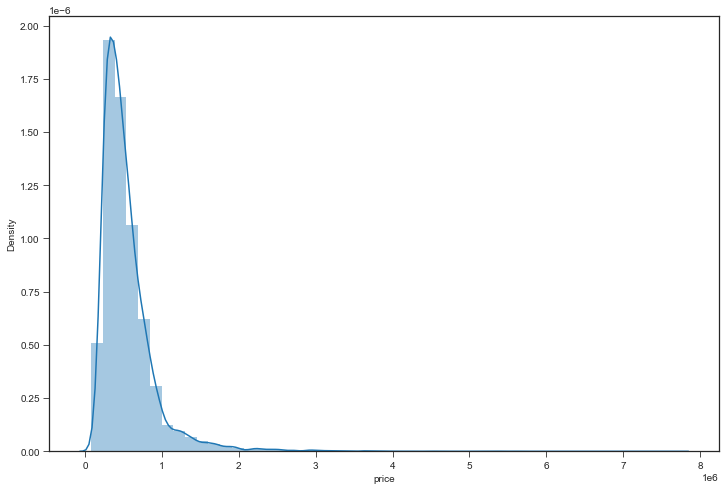

In [10]:
plt.figure(figsize=(12,8))
sns.distplot(df['price']);

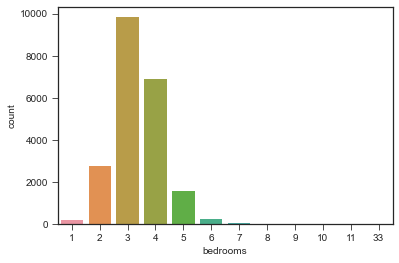

In [11]:
sns.countplot(df['bedrooms']);

In [12]:
df.bedrooms.value_counts().sort_index()

1      196
2     2760
3     9824
4     6882
5     1601
6      272
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

**11 ve 33 bedrooms olan 1'er adet observation var.Bu:**
* Otel/Pansiyon/Malikane olabilir
* Outlier bir ev olabilir
* Typo hatasi olabilir.

Diger features a bakarak buna karar vermeliyiz.

In [13]:
df.groupby(df.bedrooms).bathrooms.describe()

,count,mean,std,min,25%,50%,75%,max
bedrooms,,,,,,,,
1,196.000,1.083,0.341,0.500,1.000,1.000,1.000,2.500
2,2760.000,1.402,0.540,0.500,1.000,1.000,1.750,3.500
3,9824.000,1.968,0.630,0.750,1.500,2.000,2.500,4.500
4,6882.000,2.436,0.647,0.500,2.000,2.500,2.750,5.750
5,1601.000,2.779,0.836,1.000,2.250,2.750,3.250,6.750
6,272.000,3.068,1.065,1.000,2.500,3.000,3.750,8.000
7,38.000,3.651,1.386,1.000,2.750,3.500,4.250,8.000
8,13.000,3.558,1.011,2.500,2.750,3.250,4.000,6.000
9,6.000,4.417,1.656,3.000,3.250,4.250,4.500,7.500


* bathroom sayisina gore grupladigimizda typo hatasi oldugunu tespit ettik.

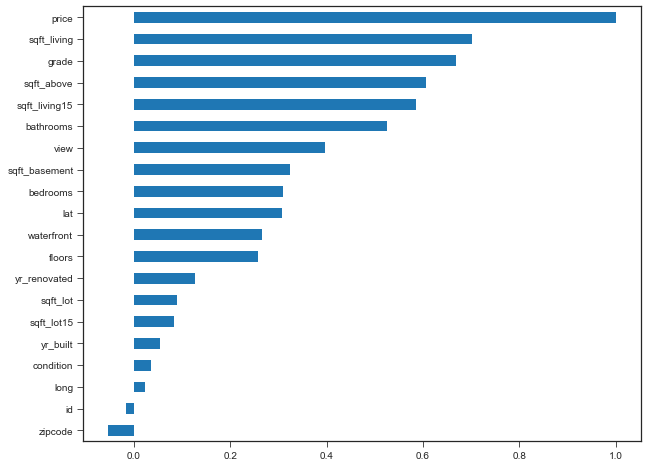

In [14]:
plt.figure(figsize=(10,8))
df.corr().price.sort_values().plot(kind='barh');

# Alternative
# df.corr()["price"].sort_values().plot.barh();

* target label ile en cok korrele feature a odaklanalim

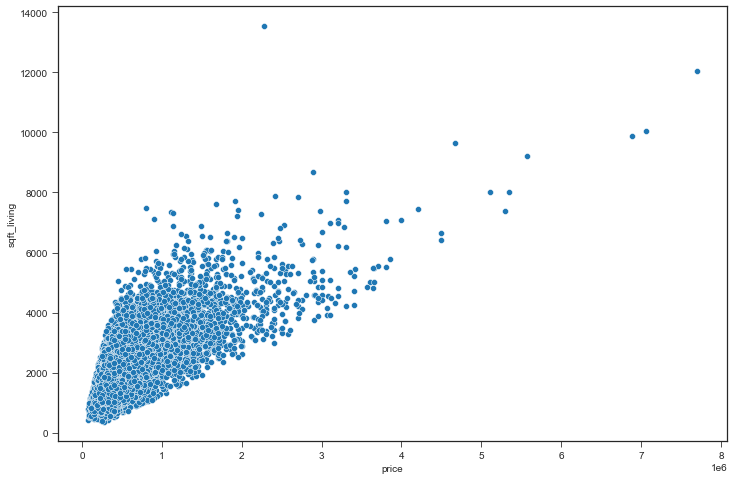

In [15]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='sqft_living',data=df);

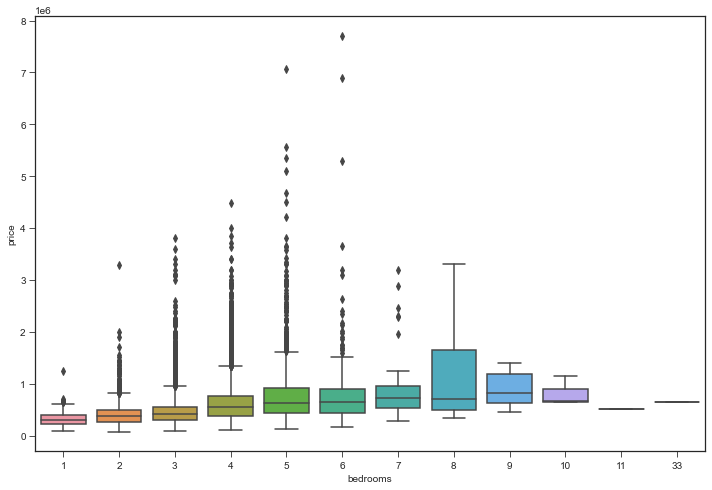

In [16]:
plt.figure(figsize=(12,8))
sns.boxplot(x='bedrooms',y='price',data=df);

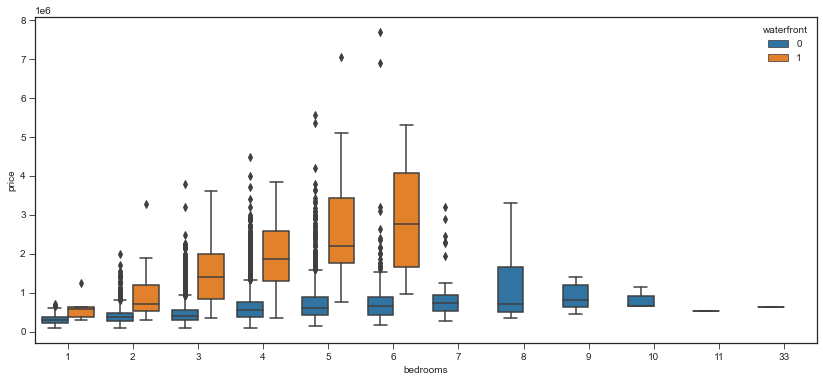

In [17]:
plt.figure(figsize=(14,6))
sns.boxplot(x='bedrooms', y='price', data=df, hue='waterfront');

### Geographical Properties

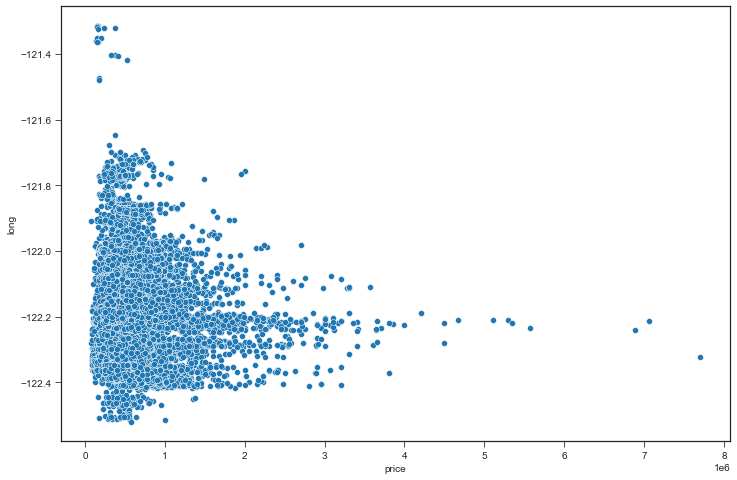

In [18]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='long',data=df);

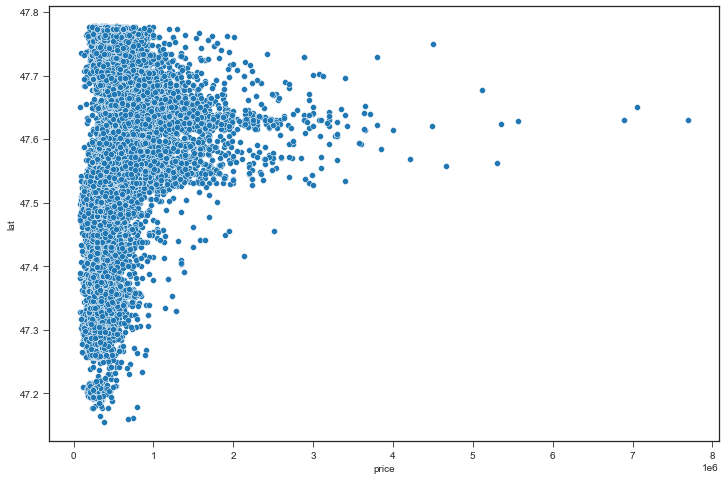

In [19]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='lat',data=df);

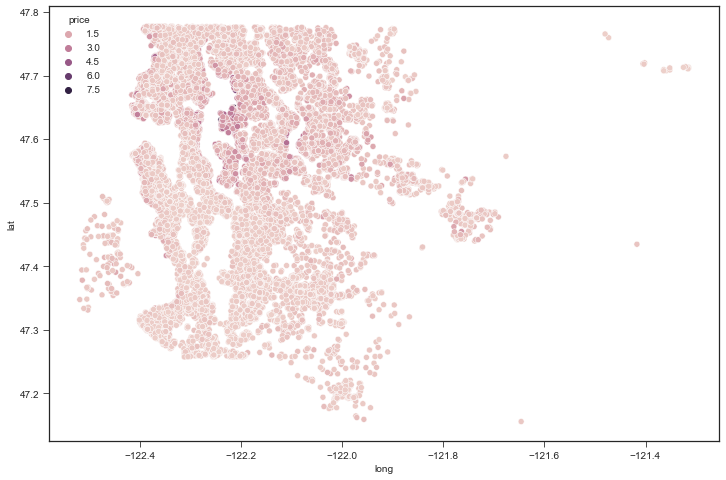

In [20]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat',data=df,hue='price');

In [21]:
# https://i.pinimg.com/originals/4a/ab/31/4aab31ce95d5b8474fd2cc063f334178.jpg
import folium
map_kc = folium.Map(location=[df["lat"].mean(),df["long"].mean()], zoom_start=8)

for lat, lng in zip(df['lat'], df['long']):
    folium.CircleMarker(
        [lat, lng],
        radius=0.1,
        color='blue',
        fill=False,
        fill_color='#3186CC',
        fill_opacity=0.1).add_to(map_kc)
map_kc

* Fiyatlar arasinda ucurum var. Bu nedenle Hue parametresi ile fiyat ayrimlari iyi gozlenemedi.
* Cozum olarak; fiyata gore siralama yapip en yuksek fiyatli %1 lik kismi dahil etmeden grafigi cizdirelim

In [22]:
df.sort_values('price',ascending=False).head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,...,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,...,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,...,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,...,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,...,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,7558700030,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,...,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,1247600105,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,...,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,1924059029,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,...,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,7738500731,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,...,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,3835500195,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,...,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


**all palette colormaps:** https://user-images.githubusercontent.com/42834869/49302025-e5dbea00-f500-11e8-8ff8-cb5960afd781.JPEG

Yukaridan en uygun palette secilir.

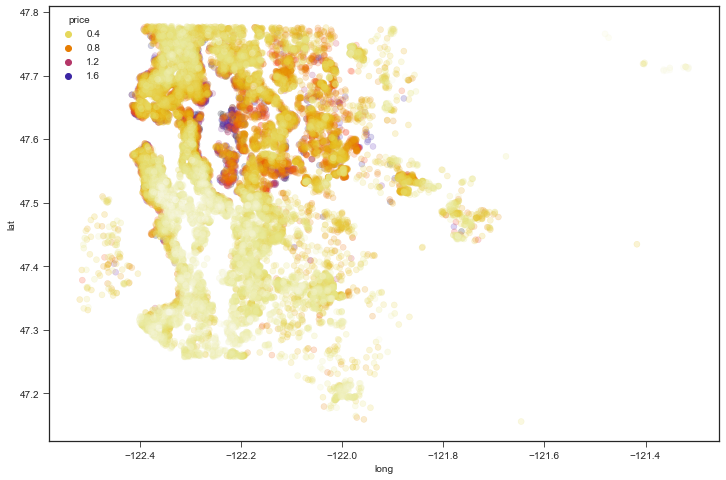

In [23]:
df2 = df.sort_values('price',ascending=False).iloc[round(len(df)*0.01):]

plt.figure(figsize=(12,8))
sns.scatterplot(x='long',
                y='lat',
                data=df2,
                hue='price',
                palette='CMRmap_r',
                edgecolor=None,
                alpha=0.2);

## Feature Engineering

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [25]:
df = df.drop('id',axis=1)
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


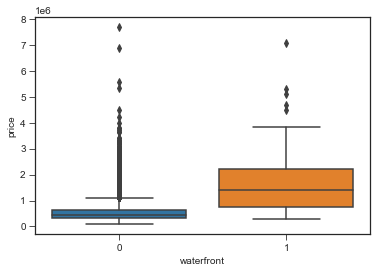

In [26]:
sns.boxplot(x='waterfront',y='price',data=df);

* Deniz manzarali olan evlerde fiyatlar daha yuksek ve kendi icinde dagilimi daha dengeli 

**Date**
* tarih verisi olmasina ragmen type i farkli olan features da type transformation yapalim
* tarih verisinden `feature engineering` yapmak analiz icin avantaj saglar.

In [27]:
df['date'] = pd.to_datetime(df['date'])
df['month'] = df['date'].apply(lambda date:date.month)
df['year'] = df['date'].apply(lambda date:date.year)

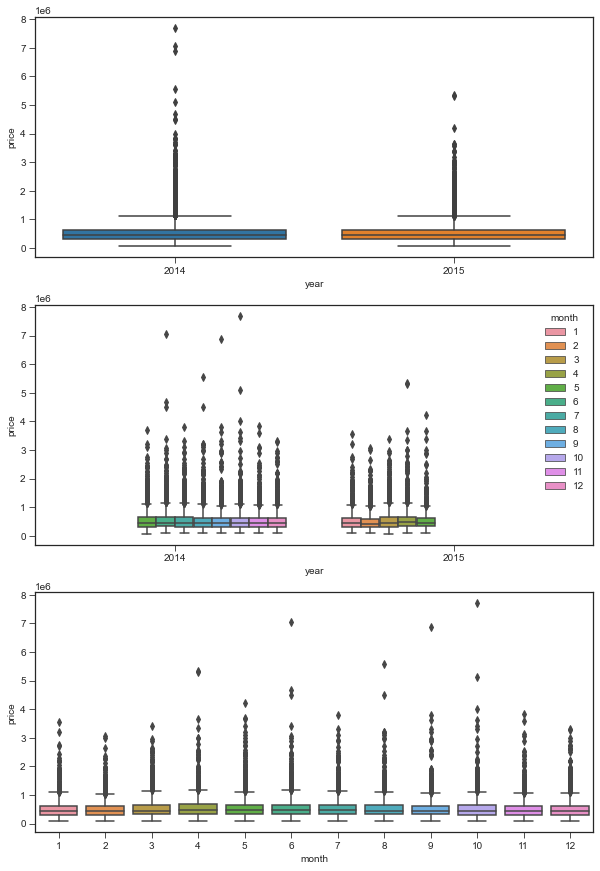

In [28]:
plt.figure(figsize=(10,15))

plt.subplot(311)
sns.boxplot(x='year',y='price', data=df)

plt.subplot(312)
sns.boxplot(x='year',y='price',hue='month',data=df)

plt.subplot(313)
sns.boxplot(x='month',y='price',data=df)
plt.show()

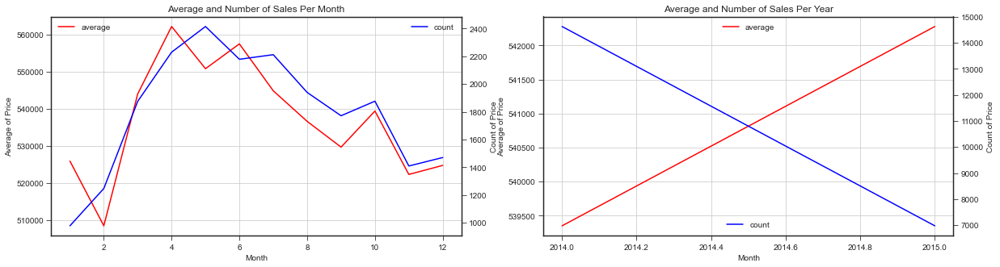

In [29]:
fig = plt.figure(figsize=(20,5))

fig.add_subplot(121)
ax = fig.add_subplot(121)
df.groupby('month').mean()['price'].plot(ax=ax,color='r',label='average')
plt.legend(loc="upper left")

ax2 = ax.twinx()
df.groupby('month').count()['price'].plot(ax=ax2,color='b',label='count')
plt.legend(loc="upper right")
ax.grid()
plt.title("Average and Number of Sales Per Month")
ax.set_xlabel("Month")
ax.set_ylabel('Average of Price')
ax2.set_ylabel("Count of Price")


fig.add_subplot(122)
ax = fig.add_subplot(122)
df.groupby('year').mean()['price'].plot(ax=ax,color='r',label='average')
plt.legend(loc='upper center')

ax2 = ax.twinx()
df.groupby('year').count()['price'].plot(ax=ax2,color='b',label='count')
plt.legend(loc='lower center')
ax.grid()
plt.title("Average and Number of Sales Per Year")
ax.set_xlabel("Month")
ax.set_ylabel('Average of Price')
ax2.set_ylabel("Count of Price")

plt.show()

**yr_built to age**

In [30]:
df.yr_built.value_counts()

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

In [31]:
df['age']=2021-df.yr_built
df.drop('yr_built',axis=1,inplace=True)

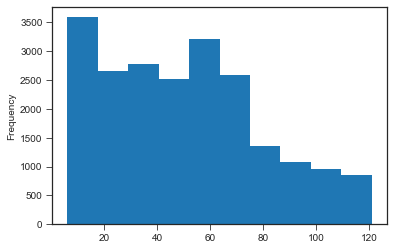

In [32]:
df.age.plot.hist();

**zipcode**

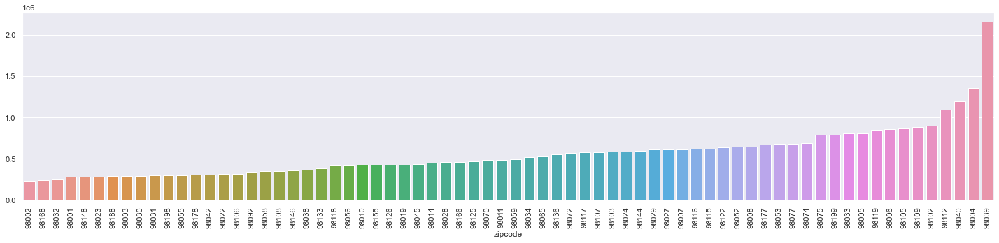

In [33]:
zip_code=df.groupby('zipcode').price.mean().sort_values()

plt.figure(figsize=(20,5))
sns.set_theme()
ax=sns.barplot(x=zip_code.index,y=zip_code.values,order=zip_code.index)
plt.xticks(rotation=90)
plt.tight_layout();

* price > 2M ise class 5,
* price > 1M ise class 4,
* price > 700K ise class 3,
* price > 400K ise class 2,
* price < 400K ise class 1,

In [34]:
def cls(x):
    if df[df.zipcode==x].price.mean()>=2e+06:
        return 5
    elif df[df.zipcode==x].price.mean()>=1e+06:
        return 4
    elif df[df.zipcode==x].price.mean()>=7e+05:
        return 3
    elif df[df.zipcode==x].price.mean()>4e+05:
        return 2
    else:
        return 1

df['zip'] = df.zipcode.apply(cls)

In [35]:
df.drop(['date','zipcode'],axis=1,inplace=True)
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_renovated', 'lat', 'long', 'sqft_living15',
       'sqft_lot15', 'month', 'year', 'age', 'zip'],
      dtype='object')

In [36]:
df.groupby('zip').price.mean()

zip
1    316996.338
2    552262.805
3    829255.852
4   1223341.894
5   2161300.000
Name: price, dtype: float64

In [37]:
df.zip.value_counts()

2    11537
1     6742
3     2400
4      868
5       50
Name: zip, dtype: int64

**yr_renovated and sqft_basement**

In [38]:
df[['yr_renovated','sqft_basement']]

,yr_renovated,sqft_basement
0,0,0
1,1991,400
2,0,0
3,0,910
4,0,0
...,...,...
21592,0,0
21593,0,0
21594,0,0
21595,0,0


In [39]:
# could make sense due to scaling, higher should correlate to more value
df['yr_renovated'].value_counts()

0       20683
2014       91
2013       37
2003       36
2000       35
        ...  
1934        1
1959        1
1951        1
1948        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

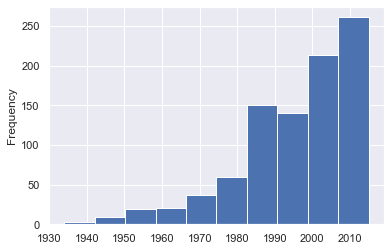

In [40]:
df[df.yr_renovated!=0].yr_renovated.plot.hist();

In [41]:
df['sqft_basement'].value_counts()

0       13110
600       221
700       218
500       214
800       206
        ...  
792         1
2590        1
935         1
2390        1
248         1
Name: sqft_basement, Length: 306, dtype: int64

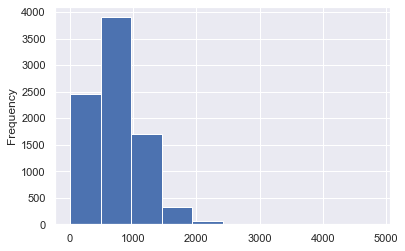

In [42]:
df[df.sqft_basement!=0].sqft_basement.plot.hist();

* 'yr_renovated' ve 'sqft_basement' bool degere dondurmektense boyle birakmak daha dogru.
* Cunku verimizi scale ederek (0,1) arasina sikistiracagiz, boylece olcek farkini ortadan kaldiracagiz. 

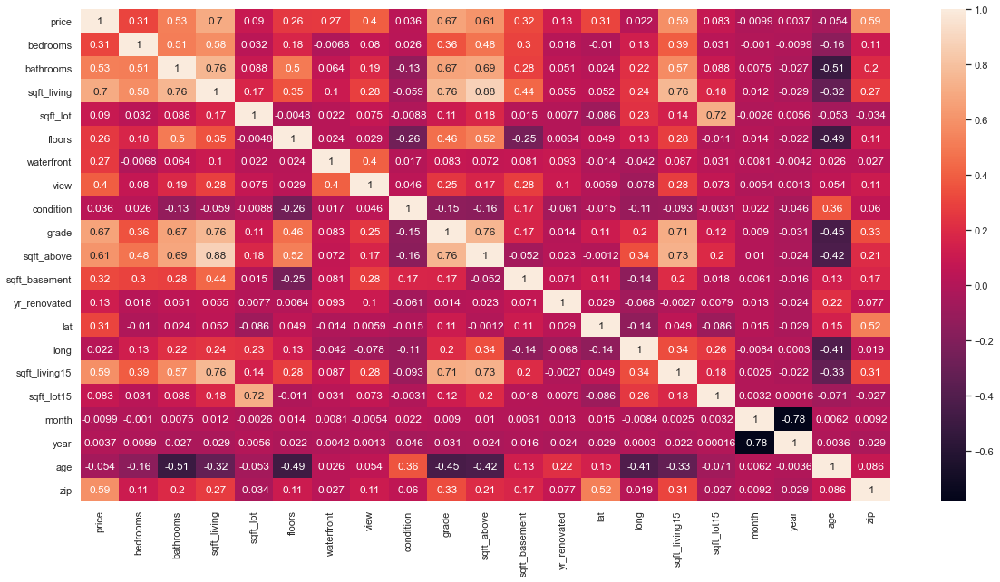

In [43]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(), annot=True);

## Scaling and Train Test Split

* Burada Min-Max Scaler kullanacagiz.
* Min-max Scaler outliers sensitivedir. 
* Veride outlier cok ise min-max scaler kullanmamamiz gerekir. yoksa iyi performans alamayiz.
* Elimizde outliers cok ise **`RobustScaler()`** kullanilir. Bu scale metodu outlier insensitivedir.

In [44]:
X = df.drop('price',axis=1).values
y = df['price'].values

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [45]:
# scaler = RobustScaler()
scaler = MinMaxScaler()
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [46]:
X_train.shape, X_test.shape

((15117, 20), (6480, 20))

## Creating a Model

In [77]:
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Activation
# from tensorflow.keras.optimizers import Adam

In [78]:
model = Sequential()

model.add(Dense(20,activation='relu')) # 20 feature var, Dense 20 seceriz.
model.add(Dense(20,activation='relu'))
model.add(Dense(20,activation='relu'))
model.add(Dense(20,activation='relu'))
model.add(Dense(1)) # regresyon oldugu icin otbut layer Dense 1 secilir, aktivation function olmaz.
opt=Adam(lr=0.001)
model.compile(optimizer=opt,loss='mse')

## Training the Model

In [79]:
model.fit(x=X_train,
          y=y_train,
          validation_data=(X_test,y_test),
          batch_size=32,epochs=300)

Epoch 1/300
473/473 [==============================] - 1s 1ms/step - loss: 421436839944.6414 - val_loss: 352164773888.0000
Epoch 2/300
473/473 [==============================] - 0s 1ms/step - loss: 243509459056.3376 - val_loss: 92276613120.0000
Epoch 3/300
473/473 [==============================] - 0s 1ms/step - loss: 93439454877.7046 - val_loss: 86680936448.0000
Epoch 4/300
473/473 [==============================] - 0s 1ms/step - loss: 87867203497.5865 - val_loss: 81052000256.0000
Epoch 5/300
473/473 [==============================] - ETA: 0s - loss: 77209154241.575 - 0s 1ms/step - loss: 77216132618.8017 - val_loss: 74878255104.0000
Epoch 6/300
473/473 [==============================] - 0s 1ms/step - loss: 71443266901.3333 - val_loss: 68861558784.0000
Epoch 7/300
473/473 [==============================] - 0s 998us/step - loss: 68891751808.5401 - val_loss: 61612240896.0000
Epoch 8/300
473/473 [==============================] - 0s 992us/step - loss: 65843839291.4093 - val_loss: 55143317

473/473 [==============================] - 0s 984us/step - loss: 21588230167.7637 - val_loss: 22300948480.0000
Epoch 68/300
473/473 [==============================] - 0s 974us/step - loss: 23919281830.3460 - val_loss: 22244474880.0000
Epoch 69/300
473/473 [==============================] - 0s 1ms/step - loss: 21653942809.9240 - val_loss: 22305075200.0000
Epoch 70/300
473/473 [==============================] - 0s 990us/step - loss: 20180498679.3587 - val_loss: 22108332032.0000
Epoch 71/300
473/473 [==============================] - 0s 983us/step - loss: 22185136899.2405 - val_loss: 22073620480.0000
Epoch 72/300
473/473 [==============================] - 0s 985us/step - loss: 20167838156.1519 - val_loss: 22393151488.0000
Epoch 73/300
473/473 [==============================] - 0s 989us/step - loss: 19819232091.8143 - val_loss: 21954230272.0000
Epoch 74/300
473/473 [==============================] - 0s 989us/step - loss: 20481738142.7848 - val_loss: 21973645312.0000
Epoch 75/300
473/473 [=

473/473 [==============================] - 0s 993us/step - loss: 19484707444.6582 - val_loss: 20110626816.0000
Epoch 134/300
473/473 [==============================] - 0s 1ms/step - loss: 17746350658.9705 - val_loss: 20088190976.0000
Epoch 135/300
473/473 [==============================] - 0s 982us/step - loss: 19621604326.0760 - val_loss: 20152770560.0000
Epoch 136/300
473/473 [==============================] - 0s 1ms/step - loss: 18448020593.4177 - val_loss: 20049776640.0000
Epoch 137/300
473/473 [==============================] - 0s 998us/step - loss: 18959444380.6245 - val_loss: 20009555968.0000
Epoch 138/300
473/473 [==============================] - 0s 993us/step - loss: 18907627556.7257 - val_loss: 20007010304.0000
Epoch 139/300
473/473 [==============================] - 0s 997us/step - loss: 19507973815.6287 - val_loss: 19971328000.0000
Epoch 140/300
473/473 [==============================] - 0s 988us/step - loss: 18735300456.7764 - val_loss: 19962107904.0000
Epoch 141/300
473/

473/473 [==============================] - 0s 1ms/step - loss: 20042604174.5823 - val_loss: 19174170624.0000
Epoch 200/300
473/473 [==============================] - 0s 998us/step - loss: 19661189750.8186 - val_loss: 19166220288.0000
Epoch 201/300
473/473 [==============================] - 0s 989us/step - loss: 20234415585.7553 - val_loss: 19168503808.0000
Epoch 202/300
473/473 [==============================] - 0s 999us/step - loss: 18734091205.6709 - val_loss: 19139356672.0000
Epoch 203/300
473/473 [==============================] - 0s 991us/step - loss: 18203552381.2996 - val_loss: 19362320384.0000
Epoch 204/300
473/473 [==============================] - 0s 991us/step - loss: 17156230755.3755 - val_loss: 19096551424.0000
Epoch 205/300
473/473 [==============================] - 0s 1ms/step - loss: 19603810761.9916 - val_loss: 19068710912.0000
Epoch 206/300
473/473 [==============================] - 0s 988us/step - loss: 18725811128.7089 - val_loss: 19050151936.0000
Epoch 207/300
473/

473/473 [==============================] - 0s 1ms/step - loss: 17390127002.4641 - val_loss: 18722072576.0000
Epoch 266/300
473/473 [==============================] - 0s 997us/step - loss: 17955111823.6624 - val_loss: 18778017792.0000
Epoch 267/300
473/473 [==============================] - 0s 978us/step - loss: 18063788639.0549 - val_loss: 18695305216.0000
Epoch 268/300
473/473 [==============================] - 0s 995us/step - loss: 19024547496.5063 - val_loss: 18779056128.0000
Epoch 269/300
473/473 [==============================] - 0s 993us/step - loss: 16995020413.2996 - val_loss: 18813816832.0000
Epoch 270/300
473/473 [==============================] - 0s 1ms/step - loss: 18077159609.7890 - val_loss: 18726553600.0000
Epoch 271/300
473/473 [==============================] - 0s 1ms/step - loss: 17663159765.8734 - val_loss: 18740310016.0000
Epoch 272/300
473/473 [==============================] - 0s 1ms/step - loss: 18321461809.6878 - val_loss: 18685519872.0000
Epoch 273/300
473/473 

**Underfitting**
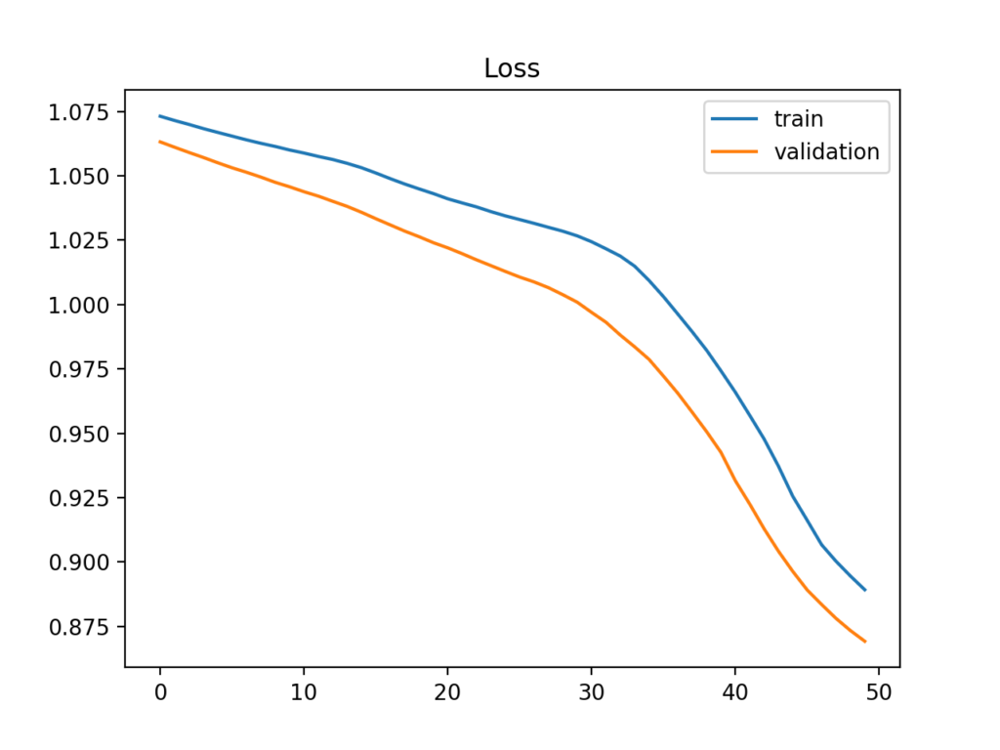
* Underfitting olmus yani yeterince ogrenmemis, train devam ederse good fit olacagi soylenebilir. Epoch artirmak gerekiyor.


**Overfitting**
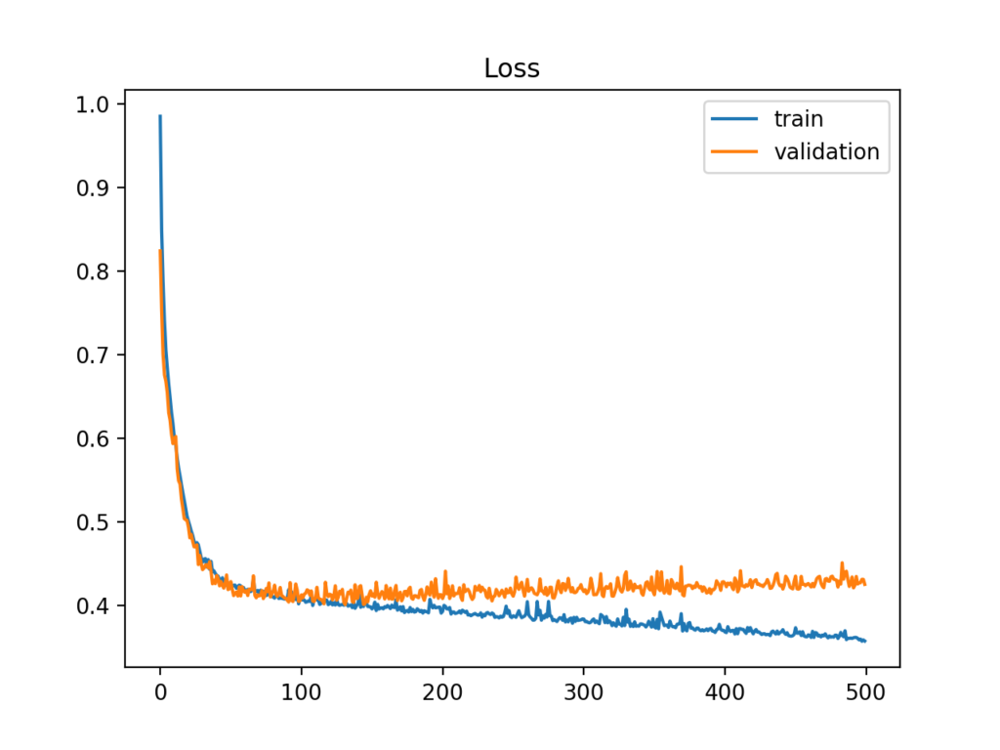
* Burada Overfitting olmus. Train datasini ezberlemis. Train azalirken, validation artiyorsa overfit anlamina gelir. 100 epoch civarinda Early stop yapmak gerekiyor.

**Goodfitting** 
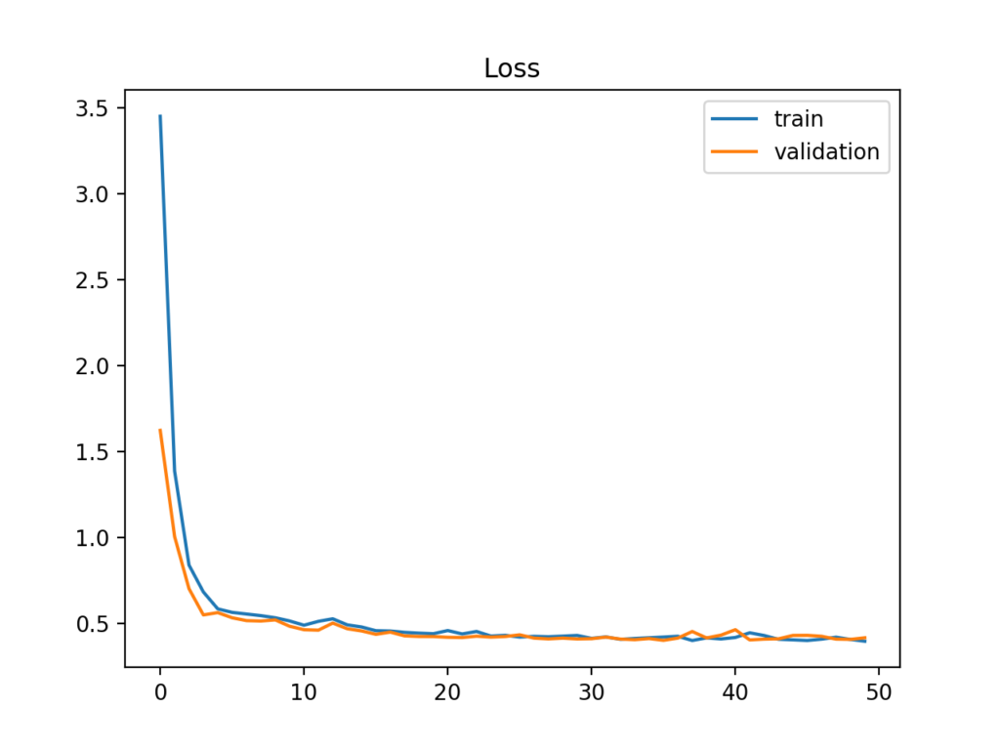
* valid ve train loss üst üste geliyorsa, good fit oldugu soylenir, Bu istenen durum.

**Poor Model Quality**
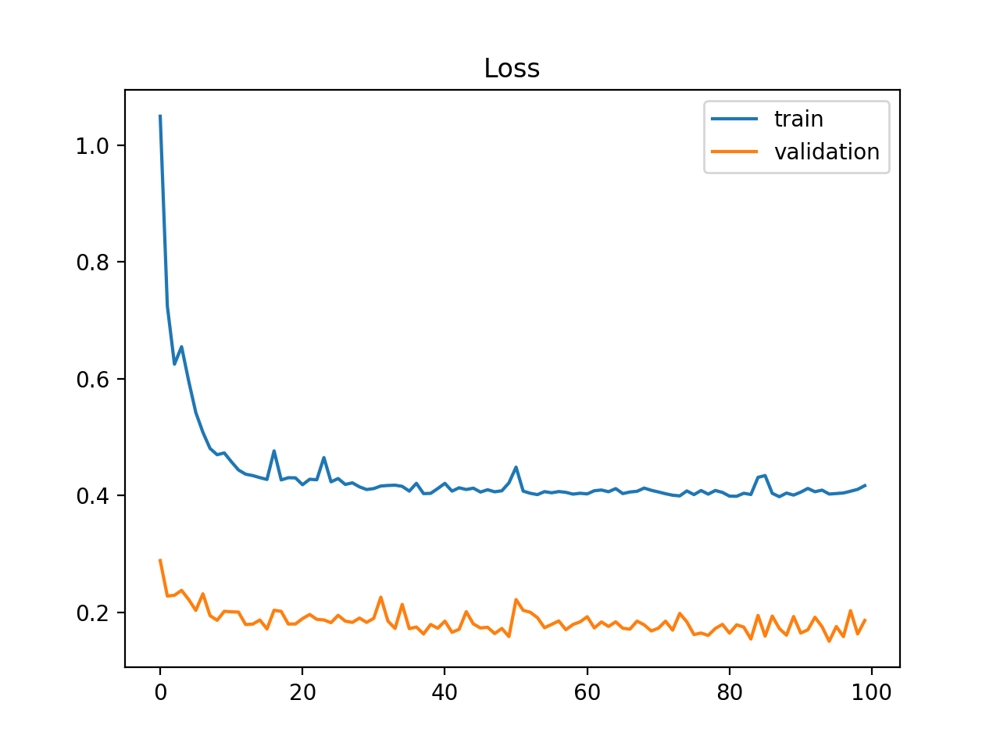
* valid ve loss ayriliyor ve loss daha yüksek degerde kaliyorsa zaten bu modeli pek dikkate almaya gerek kalmiyor. Model kalitesi düsük.

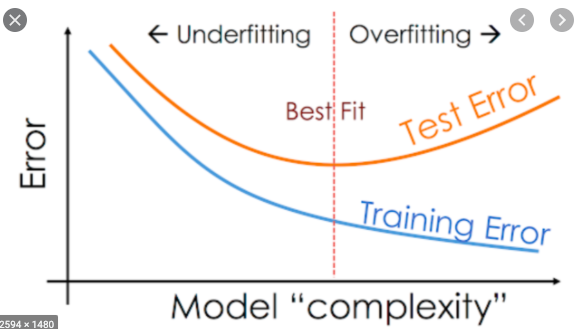

# Evaluation
https://scikit-learn.org/stable/modules/model_evaluation.html#regression-metrics

In [80]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 20)                420       
_________________________________________________________________
dense_6 (Dense)              (None, 20)                420       
_________________________________________________________________
dense_7 (Dense)              (None, 20)                420       
_________________________________________________________________
dense_8 (Dense)              (None, 20)                420       
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 21        
Total params: 1,701
Trainable params: 1,701
Non-trainable params: 0
_________________________________________________________________


In [81]:
# Alternative Summary
# It is working in Google Colab

# from tensorflow.keras.utils import plot_model
# dot_img_file = '/tmp/model_1.png'
# plot_model(model, to_file=dot_img_file, show_shapes=True)

<AxesSubplot:>

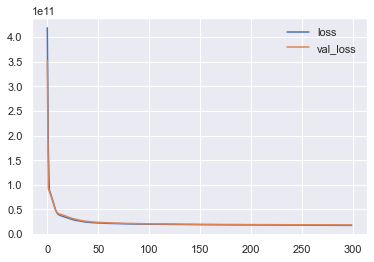

In [82]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()
# plt.ticklabel_format(style='plain')
# plt.plot(losses)

* valid ve loss üst üste geliyor, good fit.

In [83]:
# Alternative with seaborn
# loss = model.history.history['loss']
# sns.lineplot(x=range(len(loss)),y=loss)
# plt.title("Training Loss per Epoch");

**Loss-Epoch Graph**

(15000000000.0, 30000000000.0)

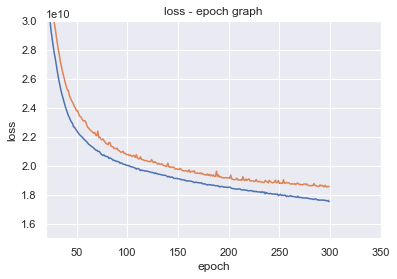

In [106]:
fig, ax= plt.subplots()
ax.plot(loss_df)
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.set_title("loss - epoch graph")
ax.set_xlim([20,350]) # focusing on the given x values
ax.set_ylim([1.5e10,3e10]) # focusing on the given y values

In [85]:
loss_df.loss.idxmin() 

299

In [86]:
loss_df.loss.min()

17520625664.0

In [87]:
loss_df.val_loss.min()

18540242944.0

In [88]:
loss_df.iloc[295]

loss       17629605888.000
val_loss   18658078720.000
Name: 295, dtype: float64

# Evaluation Metrics

In [89]:
def eval_metrics(actual, pred):
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    r2score = r2_score(actual, pred)
    print(f"R2 Score: {r2score}",
          f"Mean Absolute Error(MAE): {mae}",
          f"Mean Square Error(MSE): {mse}",
          f"Root Mean Square Error(RMSE): {rmse}",sep="\n")

In [90]:
#Training Data
y_train_pred = model.predict(X_train)
eval_metrics(y_train, y_train_pred)

R2 Score: 0.871455272714976
Mean Absolute Error(MAE): 81846.84136289029
Mean Square Error(MSE): 17475956443.653
Root Mean Square Error(RMSE): 132196.65821666218


In [91]:
# Test Data
y_pred = model.predict(X_test)
eval_metrics(y_test, y_pred)

R2 Score: 0.8600359243039101
Mean Absolute Error(MAE): 83300.03395785108
Mean Square Error(MSE): 18559021721.63644
Root Mean Square Error(RMSE): 136231.5004748771


In [92]:
# Alternatively
training_score = model.evaluate(X_train,y_train,verbose=0)
test_score = model.evaluate(X_test,y_test,verbose=0)

print('training_msa:',training_score,
      '\ntest_msa:', test_score,sep='')

training_msa:17475952640.0
test_msa:18559025152.0


* In the above code, model.evaluate() gives MSE Score. Because, as a loss parametre, we use loss="mse" in model.compile() when we create the model.

In [93]:
explained_variance_score(y_test,y_pred)

0.8603758915078872

> **explained_variance_score**

> hata varyansi ile gercek degerin varyansi arasindaki orani hesaplamak icin kullanilan bir metrik. Modelin veri setindeki farkli varyasyonlari ne kadar iyi aciklayabildigini gosteren puandir. Genellikle 0,6 treshold uzeri olmasi beklenir.

**Let's compare to the real test labels!**

In [94]:
y_test.shape, y_pred.shape

((6480,), (6480, 1))

In [95]:
my_dict={"Actual":y_test, 
         "Pred":y_pred.reshape(6480,)}

compare=pd.DataFrame(my_dict)
compare.sample(5)

,Actual,Pred
2665,410000.000,419826.562
4537,785000.000,546722.875
4417,315000.000,343441.688
3279,425000.000,525718.062
5023,420000.000,491954.625


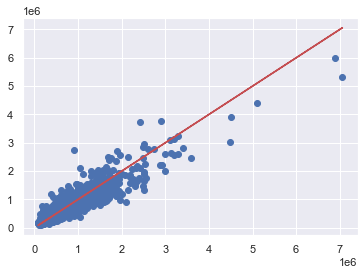

In [96]:
plt.scatter(compare.Actual,compare.Pred)
plt.plot(compare.Actual,compare.Actual,'r');

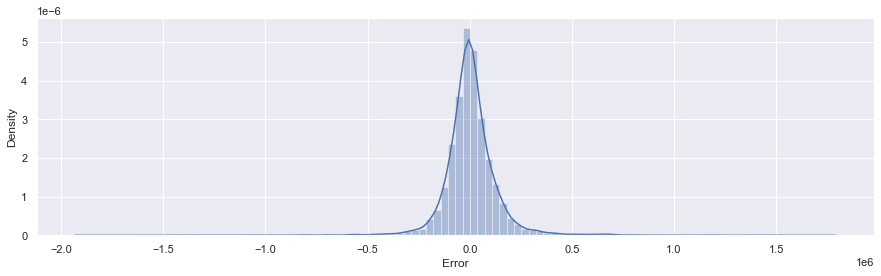

In [97]:
plt.figure(figsize=(15,4))
compare['Error'] = compare['Actual'] - compare['Pred']
sns.distplot(compare['Error'],kde=True,bins=100);

## Predicting on brand new data

In [98]:
df.shape

(21597, 21)

In [99]:
df.iloc[0]

price           221900.000
bedrooms             3.000
bathrooms            1.000
sqft_living       1180.000
sqft_lot          5650.000
floors               1.000
waterfront           0.000
view                 0.000
condition            3.000
grade                7.000
sqft_above        1180.000
sqft_basement        0.000
yr_renovated         0.000
lat                 47.511
long              -122.257
sqft_living15     1340.000
sqft_lot15        5650.000
month               10.000
year              2014.000
age                 66.000
zip                  1.000
Name: 0, dtype: float64

In [100]:
single_house = df.drop('price',axis=1).iloc[0]
single_house = scaler.transform(single_house.values.reshape(-1, 20))

In [101]:
print('Prediction Price: ', *model.predict(single_house)[0], 
      '\nActual Price: ',df.price.iloc[0], sep='')

Prediction Price: 243499.11
Actual Price: 221900.0


## Saving and Loading a Model
* We dont use pickle for Keras when we save a DL Model.
* Keras has a model loading station itself.
* Google Colab te calisirken model kaydedildiginde sol tarafta gorunur. Model oradan drag&drop ile drive da istenen klasore tasinabilir.
* Lets remember how to save a ML Model

    import pickle
    
    pickle.dump(svm,open("svm","wb"))
    
    svm_model = pickle.load(open("svm","rb"))

In [102]:
model.save('my_model.h5')  # creates a HDF5 file 'my_model.h5'
later_model = load_model('my_model.h5')

In [103]:
later_model.predict(single_house)

array([[243499.11]], dtype=float32)